# Simulation using Concord

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "simulation_trajectory_pdomain"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/{proj_name}/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

cpu


In [83]:
adata = sc.read(Path("../data/simulation_trajectory/") / f"adata_Nov24-2032.h5ad")
adata_state = sc.read(Path("../data/simulation_trajectory/") / f"adata_state_Nov24-2032.h5ad")
file_suffix = f"{time.strftime('%b%d-%H%M')}_full"
file_suffix

'Feb08-2057_full'

In [92]:
adata = sc.read(Path("../data/simulation_trajectory_overlap/") / f"adata_Nov24-1414.h5ad")
adata_state = sc.read(Path("../data/simulation_trajectory_overlap/") / f"adata_state_Nov24-1414.h5ad")
file_suffix = f"{time.strftime('%b%d-%H%M')}_overlap"

In [49]:
adata = sc.read(Path("../data/simulation_trajectory_nooverlap/") / f"adata_Nov25-1451.h5ad")
adata_state = sc.read(Path("../data/simulation_trajectory_nooverlap/") / f"adata_state_Nov25-1451.h5ad")
file_suffix = f"{time.strftime('%b%d-%H%M')}_nooverlap"

In [68]:
adata = sc.read(Path("../data/simulation_trajectory_wtgap/") / f"adata_Nov24-2111.h5ad")
adata_state = sc.read(Path("../data/simulation_trajectory_wtgap/") / f"adata_state_Nov24-2111.h5ad")
file_suffix = f"{time.strftime('%b%d-%H%M')}_wtgap"

In [84]:
state_key = 'time'
batch_key = 'batch'
state_type = 'trajectory'
batch_type = 'batch_specific_features'
distribution = 'normal'
leiden_key = 'leiden_no_noise'

In [85]:
concord_args_base = {
    'input_feature': None,
    'n_epochs': 10,
    'p_intra_knn': 0.3,
    'batch_size':64,
    'domain_key': batch_key,
    'seed': seed,
    'device': device,
    'save_dir': save_dir
}

In [86]:
# -------------------------------------
# 2. Prepare dictionary of parameter variations
#    (one parameter at a time)
# -------------------------------------
import copy
param_variations = {
    'p_intra_domain': [0.75, 0.8, .85, 0.9, .95, 1.0],  # Example: vary p_intra_knn
    #'p_intra_knn': [0.0, 0.3, 0.5, 0.7, 1.0 ],  # Example: vary p_intra_knn
}
param_keys = []
# -------------------------------------
# 3. Loop over each parameter to vary
# -------------------------------------
for param_name, values in param_variations.items():
    print(f"\n[INFO] Varying '{param_name}' with possible values: {values}\n")
    
    for value in values:
        # 3a. Copy the base arguments
        concord_args = copy.deepcopy(concord_args_base)
        
        # 3b. Update the specific parameter we want to vary
        concord_args[param_name] = value
        
        # 3c. Indicate which param is varied and to which value
        output_key = f"Concord_{param_name}_{value}"
        umap_key   = output_key + '_UMAP'
        param_keys.append(output_key)
        print(f"[INFO] Running Concord with {param_name} = {value}")
        
        # -------------------------------------
        # 4. Run Concord
        # -------------------------------------
        cur_ccd = ccd.Concord(adata, **concord_args)

        # Encode data, saving the latent embedding in adata.obsm[output_key]
        cur_ccd.encode_adata(
            input_layer_key='X',
            output_key=output_key,
            preprocess=False
        )       

print("[DONE] Finished varying each parameter individually.")



[INFO] Varying 'p_intra_domain' with possible values: [0.75, 0.8, 0.85, 0.9, 0.95, 1.0]

[INFO] Running Concord with p_intra_domain = 0.75
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 14it [00:00, 175.54it/s, loss=3.98]
Epoch 9 Training: 100%|██████████| 14/14 [00:00<00:00, 187.69it/s, loss=3.56]


[INFO] Running Concord with p_intra_domain = 0.8
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 14it [00:00, 237.94it/s, loss=4.01]
Epoch 9 Training: 100%|██████████| 14/14 [00:00<00:00, 246.43it/s, loss=3.74]


[INFO] Running Concord with p_intra_domain = 0.85
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 14it [00:00, 250.71it/s, loss=4.01]
Epoch 9 Training: 100%|██████████| 14/14 [00:00<00:00, 240.33it/s, loss=3.62]


[INFO] Running Concord with p_intra_domain = 0.9
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 14it [00:00, 249.62it/s, loss=4]
Epoch 9 Training: 100%|██████████| 14/14 [00:00<00:00, 247.34it/s, loss=3.69]


[INFO] Running Concord with p_intra_domain = 0.95
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 14it [00:00, 280.69it/s, loss=4.04]
Epoch 9 Training: 100%|██████████| 14/14 [00:00<00:00, 284.31it/s, loss=3.7]


[INFO] Running Concord with p_intra_domain = 1.0
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 14it [00:00, 265.65it/s, loss=4.06]
Epoch 9 Training: 100%|██████████| 14/14 [00:00<00:00, 267.99it/s, loss=3.81]


[DONE] Finished varying each parameter individually.


In [80]:
combined_keys = ['PCA_no_noise', 'PCA_wt_noise', "Unintegrated"] + param_keys
for key in combined_keys:
    ccd.ul.run_umap(adata, source_key=key, result_key=key + '_UMAP', random_state=seed, min_dist=0.5, metric='cosine')

In [87]:
combined_keys
show_keys = [] 
for key in combined_keys:
    key_new = f"p_dom={key.split('_')[-1]}" if 'p_intra_domain' in key else key
    adata.obsm[key_new] = adata.obsm[key]
    show_keys.append(key_new)
show_keys

['PCA_no_noise',
 'PCA_wt_noise',
 'Unintegrated',
 'p_dom=0.75',
 'p_dom=0.8',
 'p_dom=0.85',
 'p_dom=0.9',
 'p_dom=0.95',
 'p_dom=1.0']

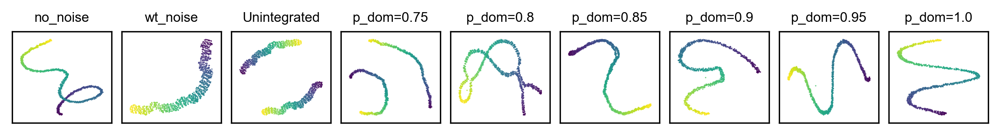

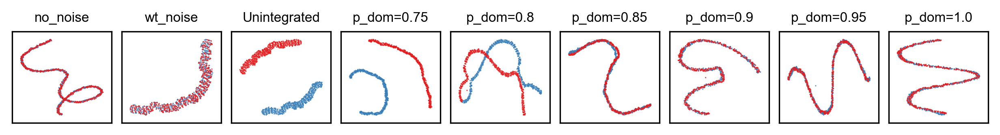

In [88]:
# plot everything
import matplotlib.pyplot as plt
import pandas as pd

# Set Arial as the default font
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

color_bys = ['time', 'batch']
#basis_types = ['KNN', 'UMAP']
#basis_types = ['PCA']
basis_types = ['KNN']
font_size=8
point_size=2.5
alpha=0.8
figsize=(0.9*len(show_keys),1)
ncols = len(show_keys)
nrows = int(np.ceil(len(show_keys) / ncols))
pal = {'time':'viridis', 'batch':'Set1'}
k=15
edges_color='grey'
edges_width=0.0
layout='kk'
threshold = 0.1
node_size_scale=0.1
edge_width_scale=0.1

rasterized = True
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        show_keys,
        color_bys=color_bys,
        basis_types=basis_types,
        pal=pal,
        k=k,
        edges_color=edges_color,
        edges_width=edges_width,
        layout=layout,
        threshold=threshold,
        node_size_scale=node_size_scale,
        edge_width_scale=edge_width_scale,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        rasterized=rasterized,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        leiden_key='leiden',
        save_dir=save_dir,
        file_suffix=file_suffix+f'rasterized_{rasterized}',
        save_format='svg'
    )


In [93]:
adata.layers['no_noise'] = np.zeros_like(adata.X)
adata.layers['wt_noise'] = np.zeros_like(adata.X)
# Find the indices of common genes between `adata` and `adata_state`
common_genes = adata.var_names.intersection(adata_state.var_names)
adata_indices = adata.var_names.get_indexer(common_genes)
adata_state_indices = adata_state.var_names.get_indexer(common_genes)

# Copy data from `adata_state` to `adata` for these common genes
adata.layers['no_noise'][:, adata_indices] = adata_state.layers['no_noise'][:, adata_state_indices].copy()
adata.layers['wt_noise'][:, adata_indices] = adata_state.layers['wt_noise'][:, adata_state_indices].copy()

# sort and smooth the signal along the path
batch_id=adata.obs['batch'].unique()[0]
batch_indices = np.where(adata.obs['batch'] == batch_id)[0]
_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord', path=batch_indices, sigma=2)
adata.obsm['Concord_sorted'] = adata.obsm['Concord'][:, feature_order]

_, _, _, feature_order = ccd.ul.sort_and_smooth_signal_along_path(adata, signal_key='Concord-decoder', path=batch_indices, sigma=2)
adata.obsm['Concord-decoder_sorted'] = adata.obsm['Concord-decoder'][:, feature_order]

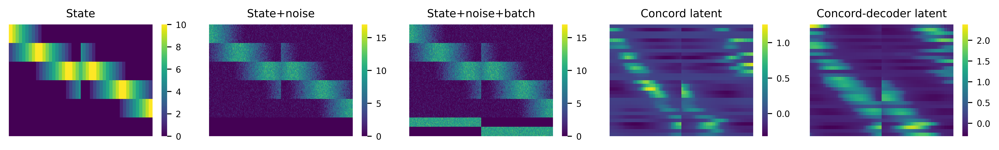

In [94]:
# Plot heatmap of original data and Concord latent
import matplotlib.pyplot as plt
figsize = (2.3, 1.8)
ncols = 5
title_fontsize = 9
dpi = 600
fig, axes = plt.subplots(1, ncols, figsize=(figsize[0] * ncols, figsize[1]), dpi=dpi)
ccd.pl.heatmap_with_annotations(adata, val='no_noise', obs_keys=[state_key], ax = axes[0], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='wt_noise', obs_keys=[state_key], ax = axes[1], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key], ax = axes[2], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='State+noise+batch', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='Concord_sorted', obs_keys=[state_key, batch_key], ax = axes[3], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
ccd.pl.heatmap_with_annotations(adata, val='Concord-decoder_sorted', obs_keys=[state_key, batch_key], ax = axes[4], use_clustermap=False, yticklabels=False, cluster_cols=False, cluster_rows=False, value_annot=False, cmap='viridis', title='Concord-decoder latent', save_path=None, figsize=figsize, dpi=dpi, title_fontsize=title_fontsize)
plt.tight_layout(w_pad=0.0, h_pad=0.1)
plt.savefig(save_dir / f"all_heatmaps_{file_suffix}.svg", dpi=dpi, bbox_inches='tight')

# Evaluation

### Scib

In [1]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key=batch_key,
    label_key=leiden_key,
    embedding_obsm_keys=latent_keys,
    n_jobs=6,
)
bm.benchmark()

KeyboardInterrupt: 

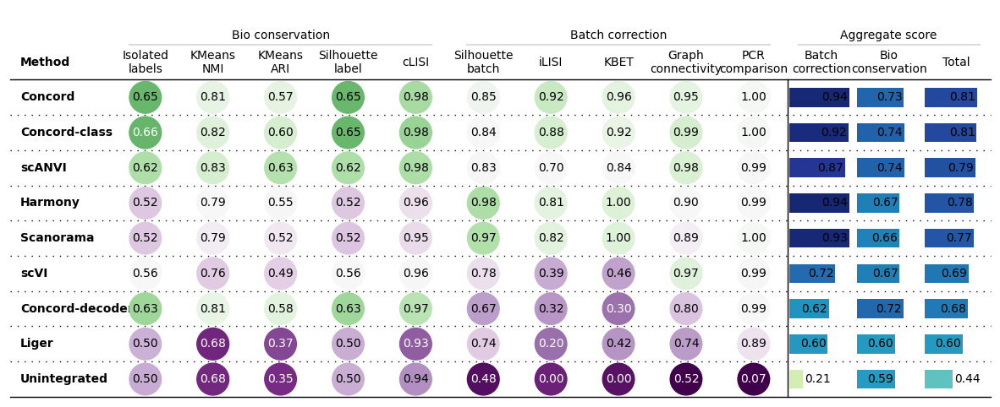

In [44]:
import matplotlib.pyplot as plt
import os
bm.plot_results_table(min_max_scale=False, show=False)
fig = plt.gcf()
fig.set_size_inches(15, 6) 
fig.savefig(os.path.join(save_dir, f'scibmetrics_results_{file_suffix}.pdf'), facecolor='white', dpi=600)
plt.show()
plt.close(fig)

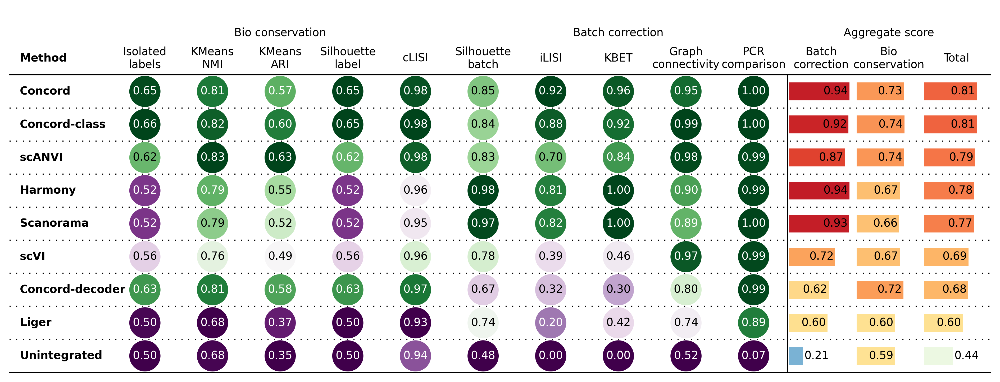

In [45]:
scib_scores = bm.get_results(min_max_scale=False)
# Convert row 'Metric Type' to multi-index column, first level is 'Metric Type', second level is existing column name
metric_type = scib_scores.loc['Metric Type']
scib_scores = scib_scores.drop('Metric Type')  # Drop the last row now that it's stored in metric_type
scib_scores.columns = pd.MultiIndex.from_tuples([(metric_type[col], col) for col in scib_scores.columns])
scib_scores = ccd.ul.benchmark_stats_to_score(scib_scores, min_max_scale=False, one_minus=False, aggregate_score=False, rank=True, rank_col=('Aggregate score', 'Total'), name_exact=False)

ccd.pl.plot_benchmark_table(scib_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', save_path=save_dir / f"scib_results_{file_suffix}.pdf", figsize=(16, 6), dpi=300)

### Topology

Run topological analysis pipeline:

In [47]:
homology_dimensions = [0,1,2]
concord_keys = ['Concord', 'Concord-decoder', 'Concord-class']
#diagrams = {}
#for key in combined_keys:
for key in concord_keys:
    print(f"Computing persistent homology for {key}")
    diagrams[key] =  ccd.ul.compute_persistent_homology(adata, key=key, homology_dimensions=homology_dimensions)

import pickle
with open(save_dir / f"topology_diagrams_{file_suffix}.pkl", 'wb') as f:
    pickle.dump(diagrams, f)

Computing persistent homology for Concord
Computing persistent homology for Concord-decoder
Computing persistent homology for Concord-class


In [48]:
save_dir / f"topology_diagrams_{file_suffix}.pkl"

PosixPath('../save/dev_simulation_trajectory-Nov24/topology_diagrams_Nov24-2032.pkl')

In [6]:
import pickle
with open(Path('../save/dev_simulation_trajectory-Nov24') / f"topology_diagrams_Nov24-2032.pkl", 'rb') as f:
    diagrams = pickle.load(f)

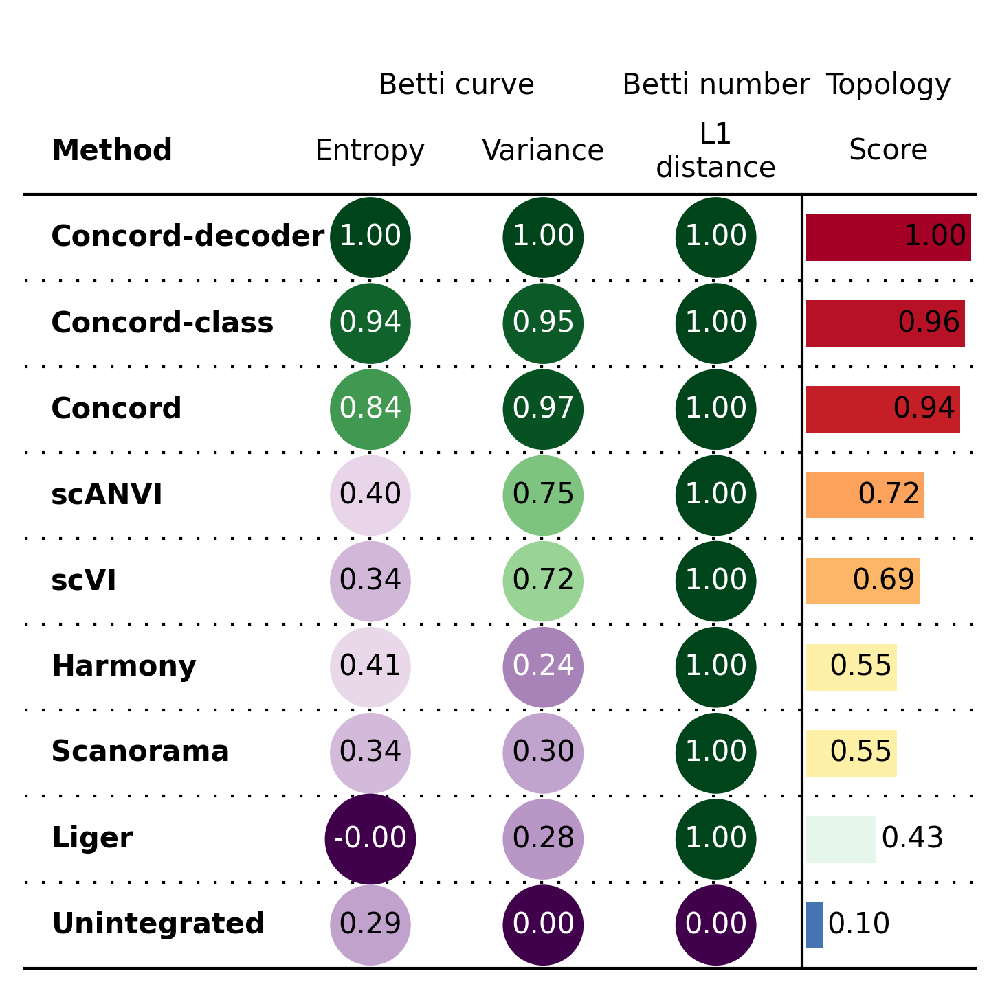

In [7]:
topology_results = ccd.ul.benchmark_topology(diagrams, expected_betti_numbers=[0,0,0], save_dir=save_dir, file_suffix=file_suffix)
max_betti = 5
topology_metrics = topology_results['combined_metrics'].drop(index=['PCA_no_noise', 'PCA_wt_noise'])
topology_metrics[('Betti number', 'L1 distance')] = topology_metrics[('Betti number', 'L1 distance')].clip(upper=5)
agg_name1 = 'Topology'
agg_name2 = 'Score'
topology_scores = ccd.ul.benchmark_stats_to_score(topology_metrics, min_max_scale=True, one_minus=True, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(topology_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"topology_results_{file_suffix}.pdf", figsize=(6, 6), dpi=300)

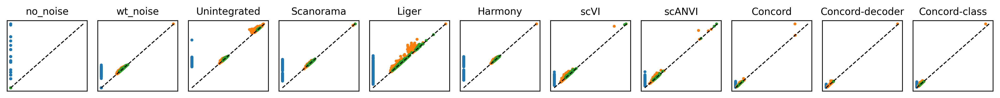

In [13]:
# Reorder diagrams with the same order as the combined keys
diagrams_ordered = {key: diagrams[key] for key in combined_keys}
# Change the key names to remove 'PCA_'
diagrams_ordered = {key.replace('PCA_', ''): diagrams_ordered[key] for key in diagrams_ordered}
ccd.pl.plot_persistence_diagrams(diagrams_ordered, base_size=(1.3, 1.5), dpi=300, marker_size=4, n_cols=11, fontsize=10, save_path=save_dir / f"persistence_diagrams_{file_suffix}.pdf", legend=False, label_axes=False, axis_ticks=False)

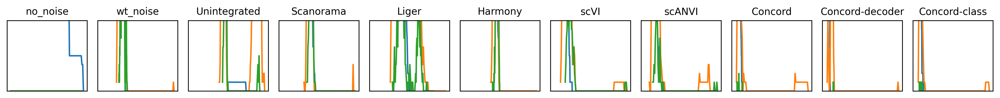

In [14]:
ccd.pl.plot_betti_curves(diagrams_ordered, nbins=100, base_size=(1.3, 1.5), n_cols=11, fontsize=10, save_path=save_dir / f"betti_curves_{file_suffix}.pdf", dpi=300, legend=False, label_axes=False, axis_ticks=False)

Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.

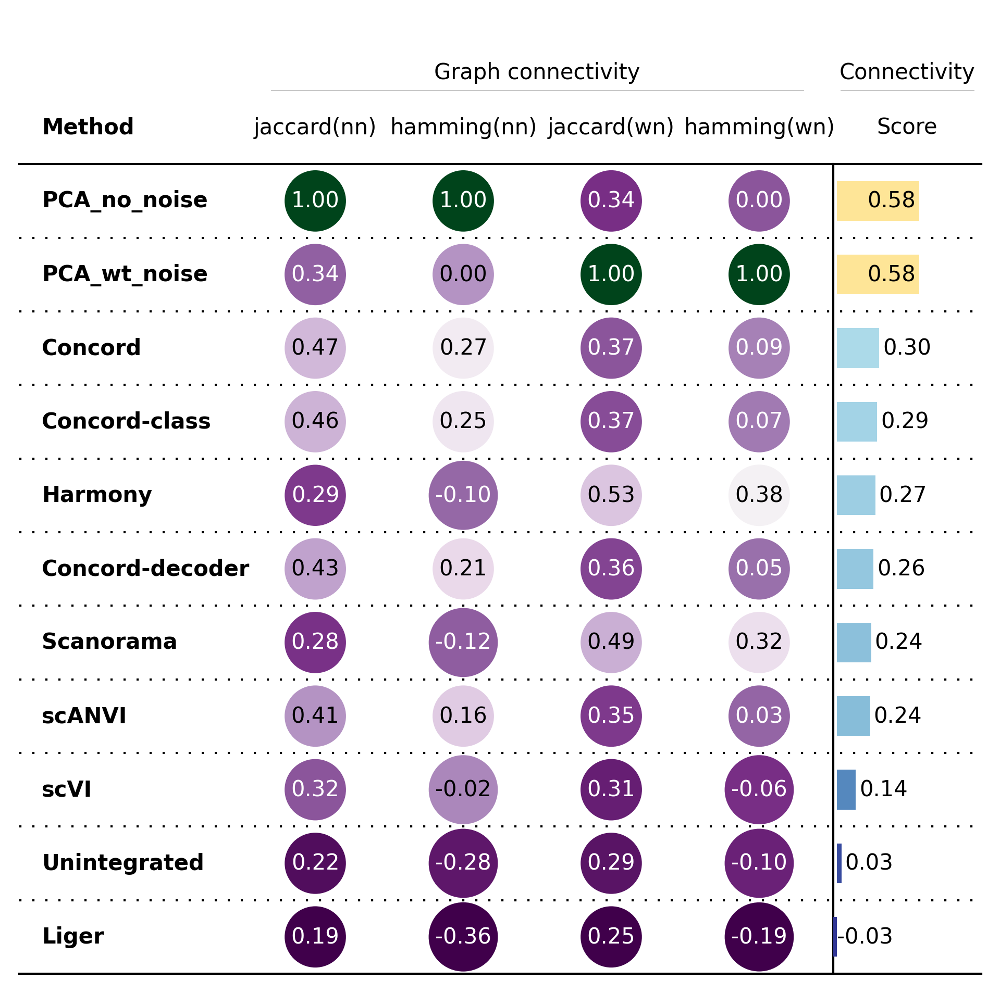

In [8]:
# compare connectivity for latent vs ground truth, store the result in a pandas dataframe
groundtruth_keys = {'(nn)': 'PCA_no_noise','(wn)': 'PCA_wt_noise'}
connectivity_df = ccd.ul.benchmark_graph_connectivity(adata, emb_keys=combined_keys, groundtruth_keys=groundtruth_keys, k=30)
agg_name1 = 'Connectivity'
agg_name2 = 'Score'
connectivity_scores = ccd.ul.benchmark_stats_to_score(connectivity_df, min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(connectivity_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"connectivity_results_{file_suffix}.pdf", figsize=(8, 8), dpi=300)


# Geomtric Features 

### Integrated benchmark pipeline

In [9]:
latent_keys = ["Unintegrated", "Scanorama", "Liger", "Harmony", "scVI", "scANVI", "Concord", 'Concord-decoder', "Concord-class"]
ground_keys = ['PCA_no_noise', 'PCA_wt_noise']
combined_keys = ground_keys + latent_keys 

In [10]:
geometry_metrics = ['pseudotime', 'cell_distance_corr', 'local_distal_corr', 'trustworthiness', 'state_distance_corr', 'state_dispersion_corr', 'state_batch_distance_ratio']
dist_metric = 'cosine'
corr_types = ['pearsonr', 'spearmanr', 'kendalltau']
#groundtruth_key = 'PCA_wt_noise'
groundtruth_key = 'PCA_no_noise'
# Convert state_dispersion to a dict of groundtruth dispersion
#groundtruth_dispersion = {'cluster_' + str(i): state_dispersion[i]**2 for i in range(5)} # convert to variance
geometry_df, geometry_full = ccd.ul.benchmark_geometry(adata, keys=combined_keys, eval_metrics=geometry_metrics, 
                                      dist_metric=dist_metric,
                                      corr_types = corr_types,
                                      groundtruth_key = groundtruth_key,
                                      state_key = leiden_key,
                                      batch_key = batch_key,
                                      #groundtruth_dispersion = groundtruth_dispersion,
                                      dispersion_metric='var',
                                      return_type='full',
                                      start_point=0,
                                      end_point=adata.n_obs-1,
                                      pseudotime_k = 30,
                                      truetime_key = 'time',
                                      save_dir=save_dir, 
                                      file_suffix=file_suffix)

Concord - INFO - Computing pseudotime correlation
Concord - INFO - Computing pseudotime for PCA_no_noise
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord - INFO - Finding path between point_0 and point_999
Concord - INFO - Computing pseudotime for PCA_wt_noise
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord - INFO - Finding path between point_0 and point_999
Concord - INFO - Computing pseudotime for Unintegrated
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord - INFO - Finding path between point_0 and point_999
Concord - INFO - Failed to compute shortest path for Unintegrated
Concord - INFO - Computing pseudotime for Scanorama
Concord.model.knn -

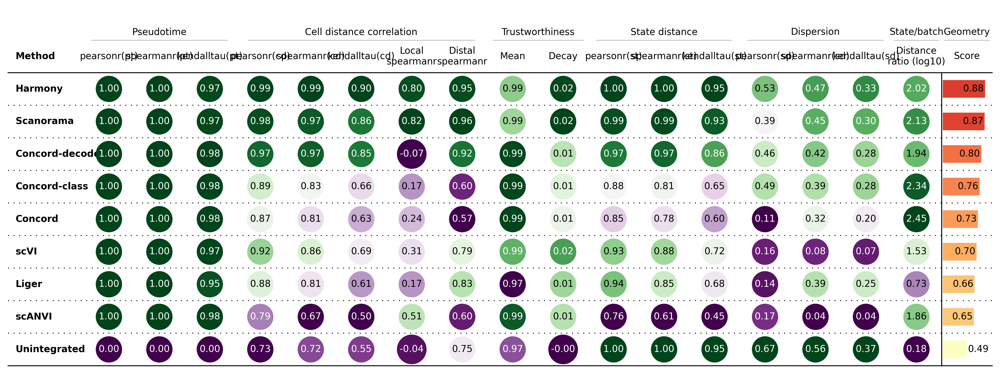

In [11]:
agg_name1 = 'Geometry'
agg_name2 = 'Score'
geometry_scores = ccd.ul.benchmark_stats_to_score(
    geometry_df.drop(index=['PCA_no_noise', 'PCA_wt_noise']), fillna = 0,               
    min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2))
ccd.pl.plot_benchmark_table(geometry_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"geometry_results_noscale_{dist_metric}_{groundtruth_key}_{file_suffix}.pdf", figsize=(19, 7), dpi=300)

In [19]:
pseudotime_result = geometry_full['Pseudotime']
pseudotime_result_no_noise = ccd.ul.compute_correlation(pseudotime_result['pseudotime'], corr_types=corr_types, groundtruth_key='PCA_no_noise')
pseudotime_result_wt_noise = ccd.ul.compute_correlation(pseudotime_result['pseudotime'], corr_types=corr_types, groundtruth_key='PCA_wt_noise')
pseudotime_result_no_noise

,pearsonr,spearmanr,kendalltau
PCA_no_noise,1.000000,1.000000,1.000000
PCA_wt_noise,0.998643,0.998806,0.970763
Scanorama,0.997319,0.998587,0.967444
Liger,0.995380,0.996154,0.948276
Harmony,0.997182,0.998728,0.968596
scVI,0.997339,0.998775,0.971026
scANVI,0.998256,0.999170,0.975595
Concord,0.997259,0.999379,0.978573
Concord-decoder,0.998703,0.999245,0.977143
Concord-class,0.998540,0.999311,0.977275


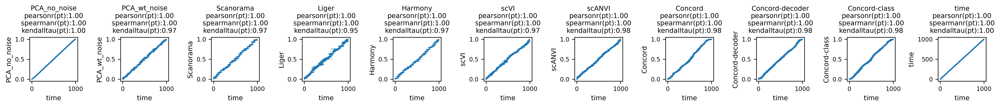

In [29]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['Pseudotime']['pseudotime'], 
    correlation= geometry_full['Pseudotime']['correlation'],
    s=3,
    ground_key = 'time', fontsize=9,
    n_cols = 11, figsize=(1.7,2.1), dpi=300, save_path=save_dir / f"pseudotime_scatter_{groundtruth_key}_{file_suffix}.pdf")

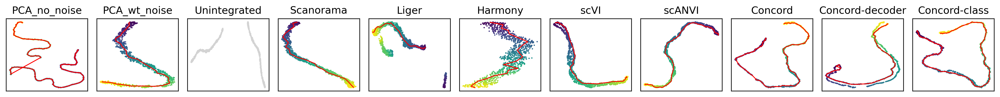

In [12]:
import matplotlib.pyplot as plt

n_cols = 11
n_rows = int(np.ceil(len(combined_keys) / n_cols))
base_size = (1.5, 1.7)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*base_size[0], n_rows*base_size[1]), dpi=300)

axes = np.atleast_2d(axes).flatten()
for basis in combined_keys:
    show_basis = basis + '_UMAP'
    if show_basis not in adata.obsm or basis not in geometry_full['Pseudotime']['pseudotime']:
        show_indices = None
        adata.obs['pseudotime_plot'] = np.nan
    else:
        show_indices = geometry_full['Pseudotime']['path'][basis]
        adata.obs['pseudotime_plot'] = geometry_full['Pseudotime']['pseudotime'][basis]
    
    show_cols = ['pseudotime_plot']

    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, highlight_indices=show_indices, highlight_size=5, draw_path=True, alpha=1.0,
        font_size=12, point_size=10, path_width=1,
        legend_loc='on data', title=basis, colorbar_loc=None, rasterized=True, xlabel=None, ylabel=None, 
        ax=axes[combined_keys.index(basis)]
    )

plt.tight_layout()
plt.savefig(save_dir / f"pseudotime_embedding_{file_suffix}.pdf")

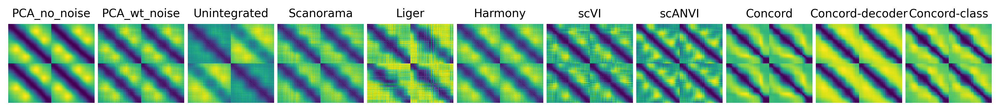

In [26]:
ccd.pl.plot_distance_heatmap(geometry_full['cell_distance_corr']['distance'], n_cols = 11, figsize=(1.1,1.3), cbar=False, dpi=300, save_path=save_dir / f"cell_distance_hmap_{file_suffix}.pdf")

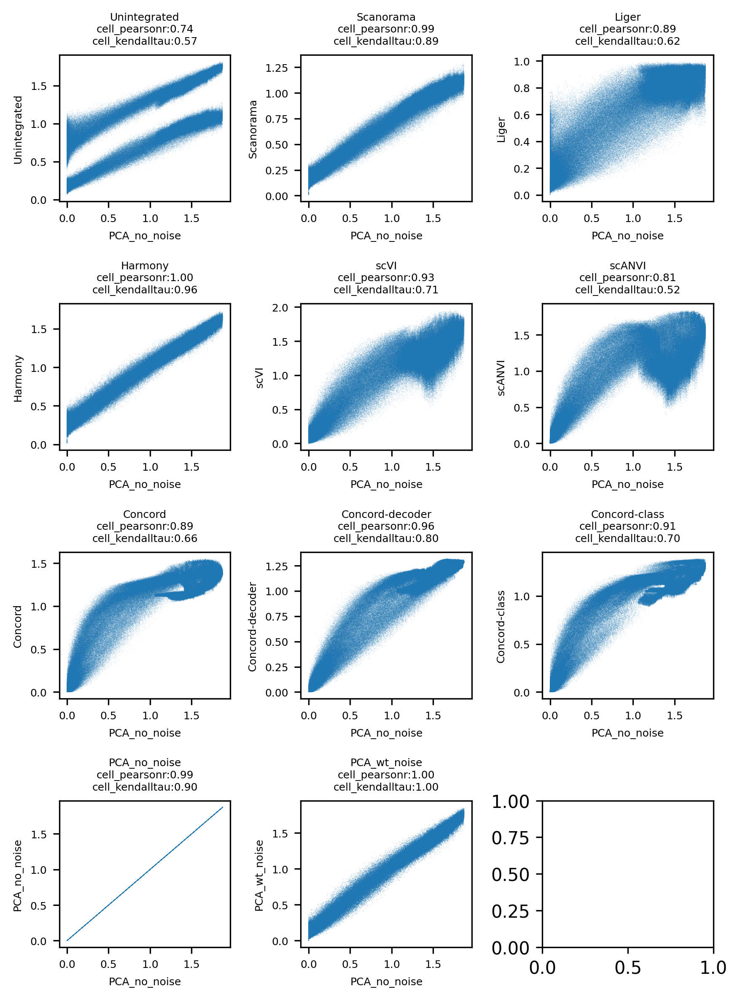

In [137]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['cell_distance_corr']['distance'], 
    correlation= geometry_full['cell_distance_corr']['correlation'],
    s=0.1, alpha = 0.2,
    n_cols = 3, figsize=(2,2), dpi=300, save_path=save_dir / f"cell_distance_scatter_{file_suffix}.png")

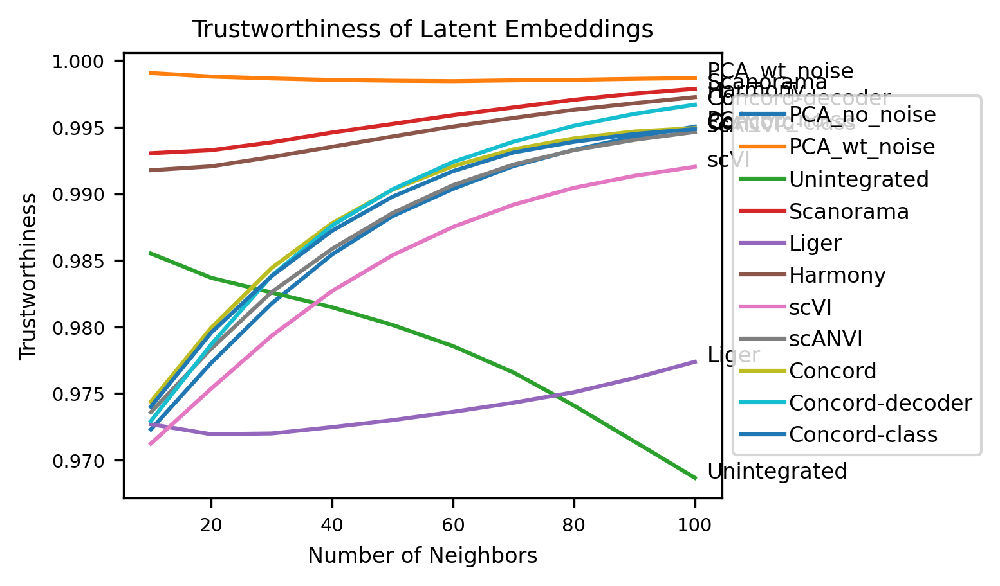

In [30]:
trustworthiness_scores = geometry_full['trustworthiness']['scores']
ccd.pl.plot_trustworthiness(trustworthiness_scores, text_shift=2, legend=True, save_path=save_dir / f"trustworthiness_{groundtruth_key}_{file_suffix}.pdf", figsize=(4,3))

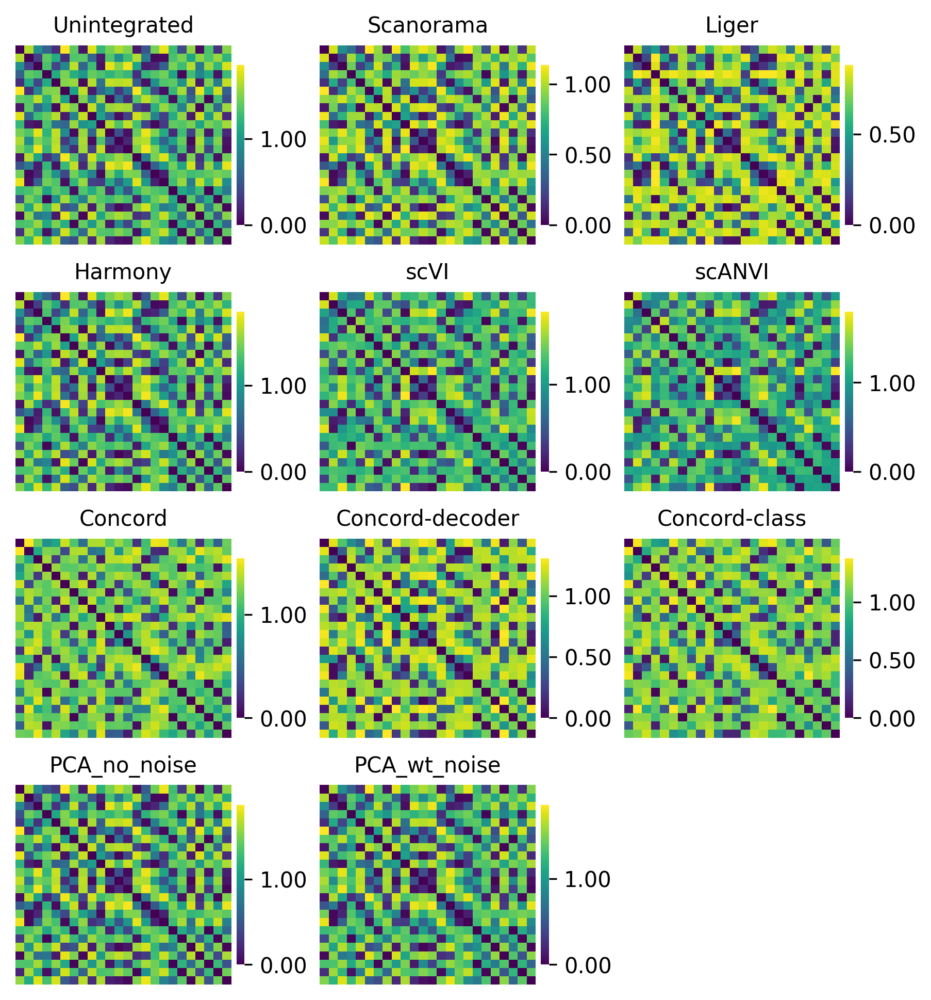

In [139]:
ccd.pl.plot_distance_heatmap(geometry_full['state_distance_corr']['distance'], 
    n_cols = 3, annot_value=False,
    figsize=(2,1.6), dpi=300, save_path=save_dir / f"cell_distance_hmap_{file_suffix}.png")

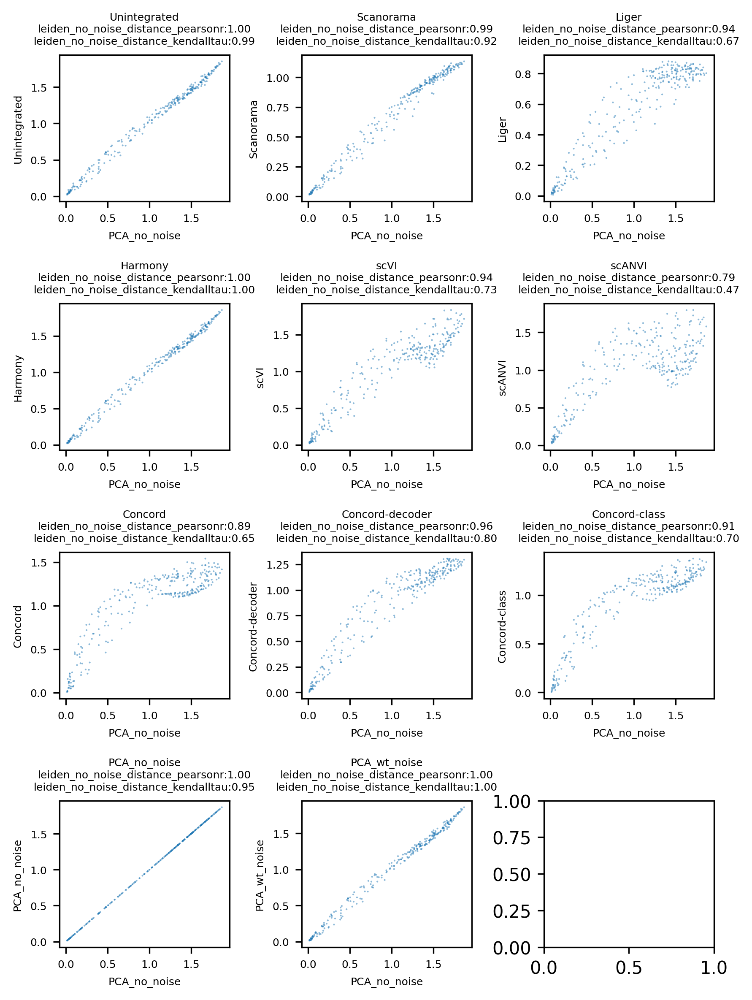

In [140]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['state_distance_corr']['distance'], 
    correlation= geometry_full['state_distance_corr']['correlation'],
    n_cols = 3, figsize=(2,2), dpi=300, save_path=save_dir / f"state_distance_scatter_{file_suffix}.pdf")

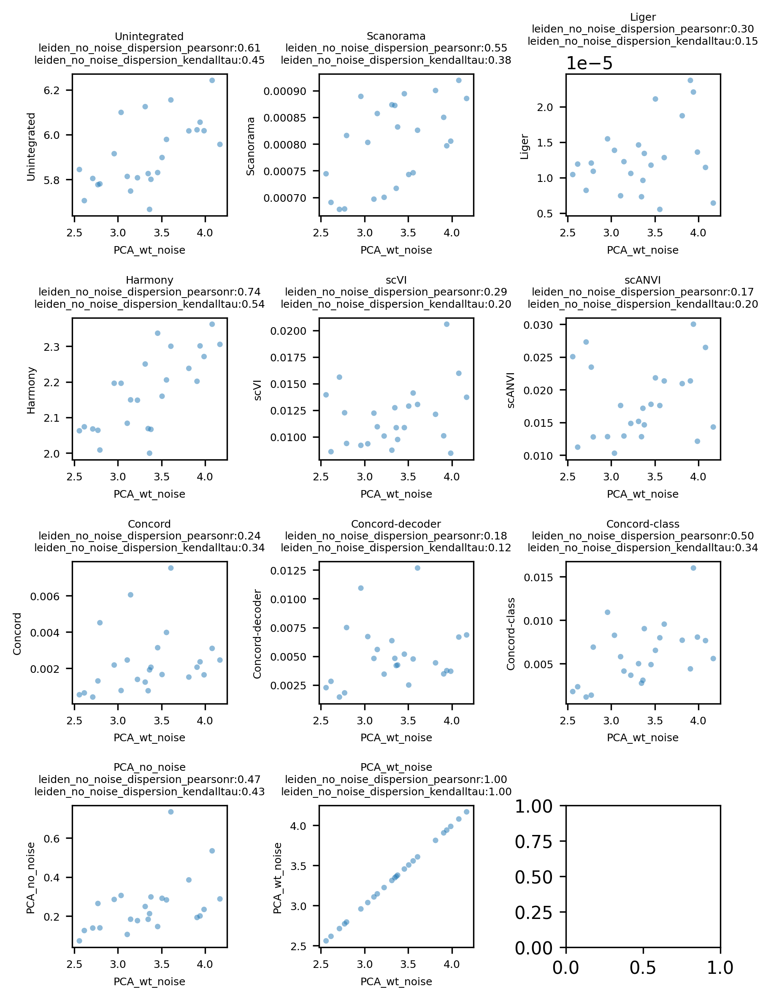

In [141]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['state_dispersion_corr']['dispersion'], 
    correlation= geometry_full['state_dispersion_corr']['correlation'],
    s=10,
    ground_key = 'PCA_wt_noise',
    n_cols = 3, figsize=(2,2), dpi=300, save_path=save_dir / f"state_distance_scatter_{file_suffix}.pdf")

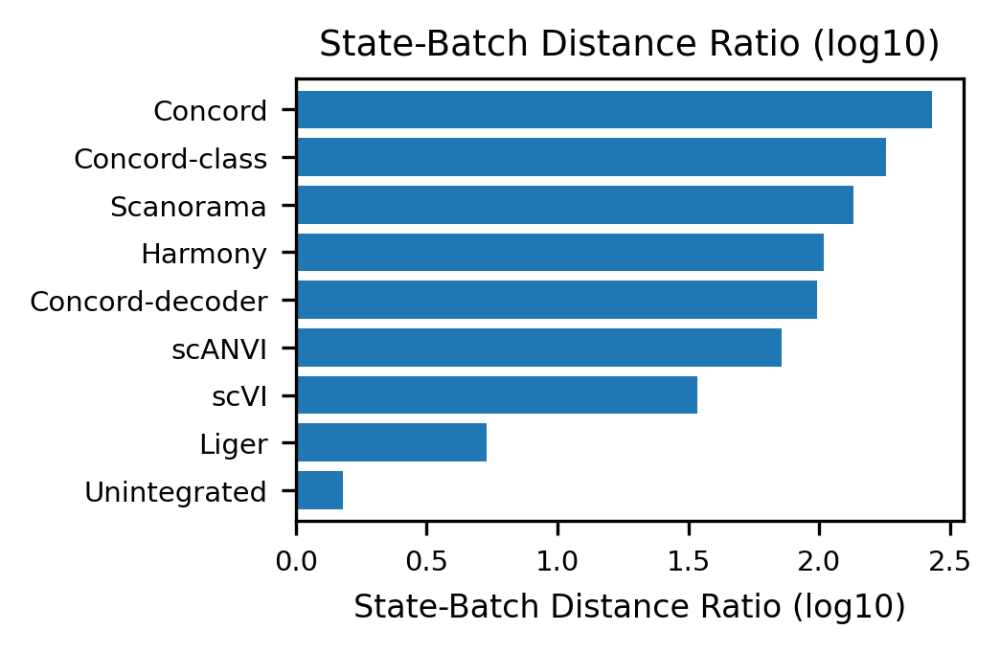

In [142]:
plot_df = geometry_full['state_batch_distance_ratio'].drop(index=['PCA_no_noise', 'PCA_wt_noise'])
ccd.pl.plot_bar(plot_df, 'State-Batch Distance Ratio (log10)', save_path=save_dir / f"state_batch_distance_ratio_{file_suffix}.pdf", figsize=(3,2), dpi=300)

### 2.0 Decoder reconstruction

In [143]:
adata.layers

Layers with keys: wt_noise, counts, scVI_corrected_batch_1, Scanorama_corrected, Liger_corrected, scANVI_corrected_batch_1, Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2

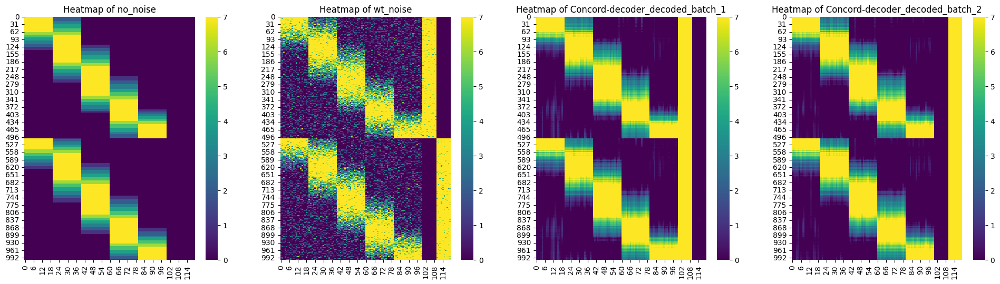

In [144]:
# Align and copy the layer data based on observation names
adata.layers['no_noise'] = np.zeros_like(adata.X)

# Find the indices of common genes between `adata` and `adata_state`
common_genes = adata.var_names.intersection(adata_state.var_names)
adata_indices = adata.var_names.get_indexer(common_genes)
adata_state_indices = adata_state.var_names.get_indexer(common_genes)

# Copy data from `adata_state` to `adata` for these common genes
adata.layers['no_noise'][:, adata_indices] = adata_state.layers['no_noise'][:, adata_state_indices].copy()

decoded_layers = ['Concord-decoder_decoded_batch_1', 'Concord-decoder_decoded_batch_2']
show_layers = ['no_noise', 'wt_noise'] + decoded_layers
ccd.pl.plot_adata_layer_heatmaps(adata, ncells=None, ngenes=None, layers=show_layers, cmap='viridis', vmin=0, vmax=7, 
                                 obs_keys=[state_key, batch_key], transpose=False, figsize=(6,6),  dpi=300, save_path=save_dir/f'decoded_heatmap_{file_suffix}.png')

In [145]:
# Compute the reconstruction error between the original and reconstructed data
mse_no_noise = np.zeros(len(decoded_layers))
mse_wt_noise = np.zeros(len(decoded_layers))
state_genes = adata.var_names[adata.var_names.isin(adata_state.var_names)]
for layer in decoded_layers:
    mse_no_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata[:,state_genes], 'no_noise', layer, metric='mse')
    mse_wt_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata[:,state_genes], 'wt_noise', layer, metric='mse')

# Report value, mean
print(f"MSE between no_noise and decoded layers: {mse_no_noise}")
print(f"MSE between wt_noise and decoded layers: {mse_wt_noise}")
print(f"Mean MSE between no_noise and decoded layers: {np.mean(mse_no_noise):.4f}")
print(f"Mean MSE between wt_noise and decoded layers: {np.mean(mse_wt_noise):.4f}")


MSE between no_noise and decoded layers: [0.35097491 0.32146425]
MSE between wt_noise and decoded layers: [2.47886576 2.47109245]
Mean MSE between no_noise and decoded layers: 0.3362
Mean MSE between wt_noise and decoded layers: 2.4750


#### Curvature analysis

In [146]:
basis = 'Concord'
pseudotime_k = 30
start_point = 0
end_point = 100
neighborhood = ccd.ml.Neighborhood(adata.obsm[basis], k=pseudotime_k, use_faiss=True)
path, _ = ccd.ul.shortest_path_on_knn_graph(neighborhood, k=pseudotime_k, point_a=start_point, point_b=end_point, use_faiss=True)


Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - WARNING - K-NN graph is not computed. Computing now.
Concord - INFO - Finding path between point_0 and point_100


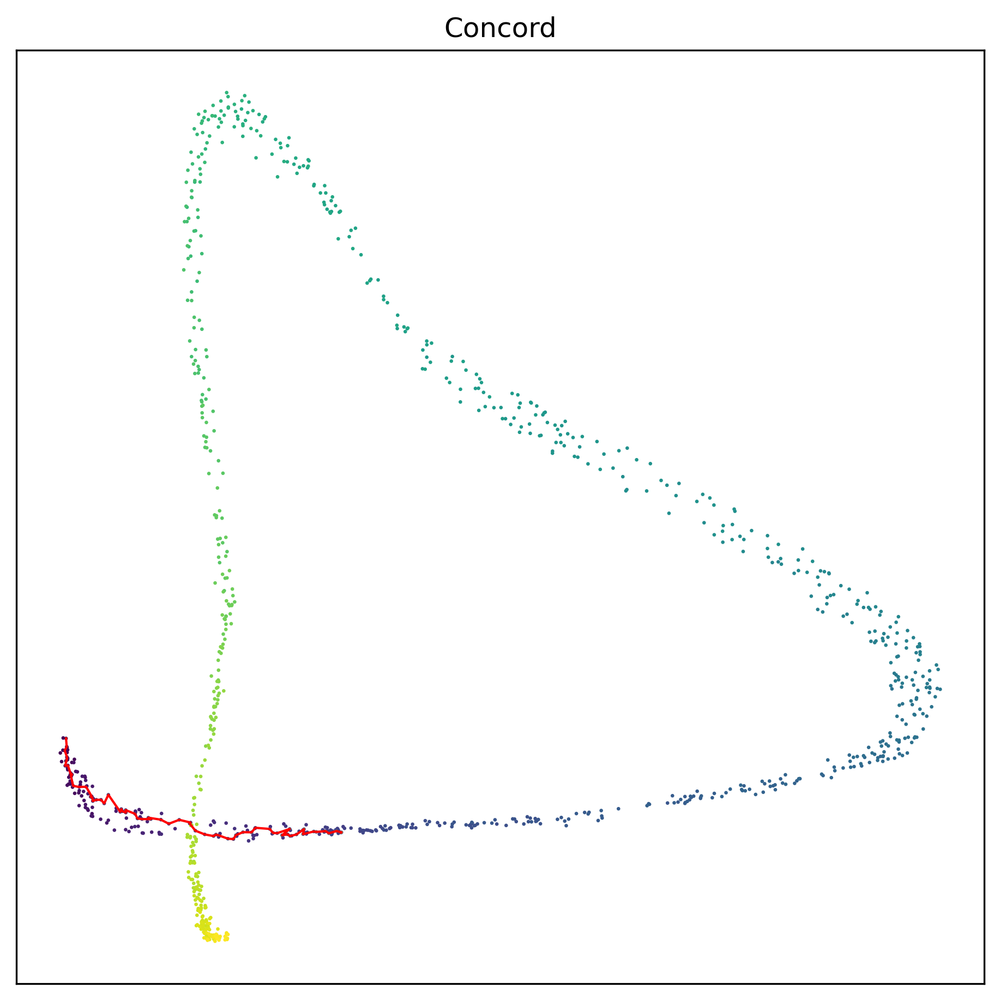

In [147]:
show_cols = ['time']
show_indices = path
show_basis = basis + '_PCA'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, highlight_indices=show_indices, highlight_size=5, draw_path=True, alpha=1.0,
    font_size=12, point_size=10, path_width=1,
    legend_loc='on data', title=basis, colorbar_loc=None, rasterized=True, xlabel=None, ylabel=None,
    figsize=(6, 6), dpi=300, save_path=save_dir / f"pseudotime_embedding_{file_suffix}.pdf"
)

In [110]:
adata.obsm['PCA_no_noise_PCA'] = adata_state.obsm['PCA_no_noise']
adata.obsm['PCA_wt_noise_PCA'] = adata_state.obsm['PCA_wt_noise']

In [138]:
curvature_res = {}
for basis in combined_keys:
    print(f"Computing curvature for {basis}")
    try:
        curvature_res[basis]=ccd.ul.curvatures_across_time(adata, basis=basis, k=10, time_key='time', time_interval_frac=0.05)
    except:
        print(f"Error computing curvature for {basis}")
        continue


Computing curvature for PCA_no_noise
Concord - INFO - Computing curvatures at time points: [  0.   49.9  99.8 149.7 199.6 249.5 299.4 349.3 399.2 449.1 499.  548.9
 598.8 648.7 698.6 748.5 798.4 848.3 898.2 948.1]
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - WARNING - K-NN graph is not computed. Computing now.
Concord - INFO - Finding path between point_0 and point_24
Concord - INFO - Finding path between point_24 and point_57
Concord - INFO - Finding path between point_57 and point_570
Concord - INFO - Finding path between point_570 and point_102
Concord - INFO - Finding path between point_102 and point_127
Concord - INFO - Finding path between point_127 and point_152
Concord - INFO - Finding path between point_152 and point_667
Concord - INFO - Finding path between point_667 and point_696
Concord - INFO - Finding path between point_696 and point_235
Conco

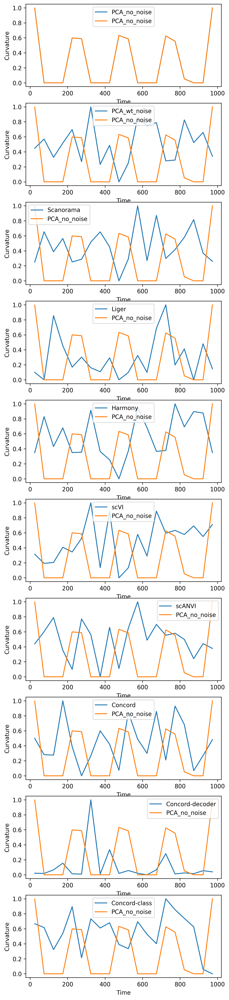

In [142]:
# Plot curvature as a function of time for each latent embedding in curvature_res, color by basis
import matplotlib.pyplot as plt


for basis in curvature_res:
    vals = curvature_res[basis]['curvature']
    curvature_res[basis]['curvature_minmax'] = (vals - vals.min()) / (vals.max() - vals.min())

# Plot curvature as a function of time for each latent embedding in curvature_res, color by basis
nrows = len(curvature_res)
ncols = 1
base_size=(6, 3)
ground_basis = 'PCA_no_noise'

fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*base_size[0], nrows*base_size[1]), dpi=300)
for i, basis in enumerate(curvature_res):
    vals = curvature_res[basis]['curvature_minmax']
    vals_ground = curvature_res[ground_basis]['curvature_minmax']
    ax[i].plot(curvature_res[basis]['mid_time'], vals, label=basis)
    ax[i].plot(curvature_res[ground_basis]['mid_time'], vals_ground, label=ground_basis)
    ax[i].set_xlabel('Time')
    ax[i].set_ylabel('Curvature')
    ax[i].legend()


plt.savefig(save_dir / f"curvature_time_{file_suffix}.pdf")



In [143]:
# Compute correlation between curvature and groundtruth curvature
curvature_list = {
    basis: curvature_res[basis]['curvature'] for basis in curvature_res
}
corr_curvature = ccd.ul.compute_correlation(curvature_list, corr_types=corr_types, groundtruth_key=ground_basis)
corr_curvature
    

,pearsonr,spearmanr,kendalltau
PCA_no_noise,1.000000,1.000000,1.000000
PCA_wt_noise,-0.529972,-0.477651,-0.337136
Scanorama,-0.661655,-0.623979,-0.478515
Liger,-0.162326,-0.097193,-0.093179
Harmony,-0.485048,-0.527691,-0.380637
scVI,-0.179533,-0.045491,-0.054377
scANVI,-0.184196,-0.385154,-0.250133
Concord,-0.039616,0.031843,0.043501
Concord-decoder,-0.202897,-0.113726,-0.065252
Concord-class,-0.087593,0.025020,0.043501


In [126]:
len(curvature_res[basis])

10

In [144]:
for basis in curvature_res:
    # Initialize the column with NaN
    adata.obs[f'curvature_{basis}'] = np.NaN

    # Assign curvature values to cells between start and end points
    for i in range(len(curvature_res[basis])):
        # Extract scalar positional indices
        start_point = int(curvature_res[basis]['start_point'].iloc[i])
        end_point = int(curvature_res[basis]['end_point'].iloc[i])

        # Assign curvature values using `.iloc` for position-based slicing
        adata.obs.iloc[start_point:end_point + 1, adata.obs.columns.get_loc(f'curvature_{basis}')] = curvature_res[basis]['curvature'].iloc[i]


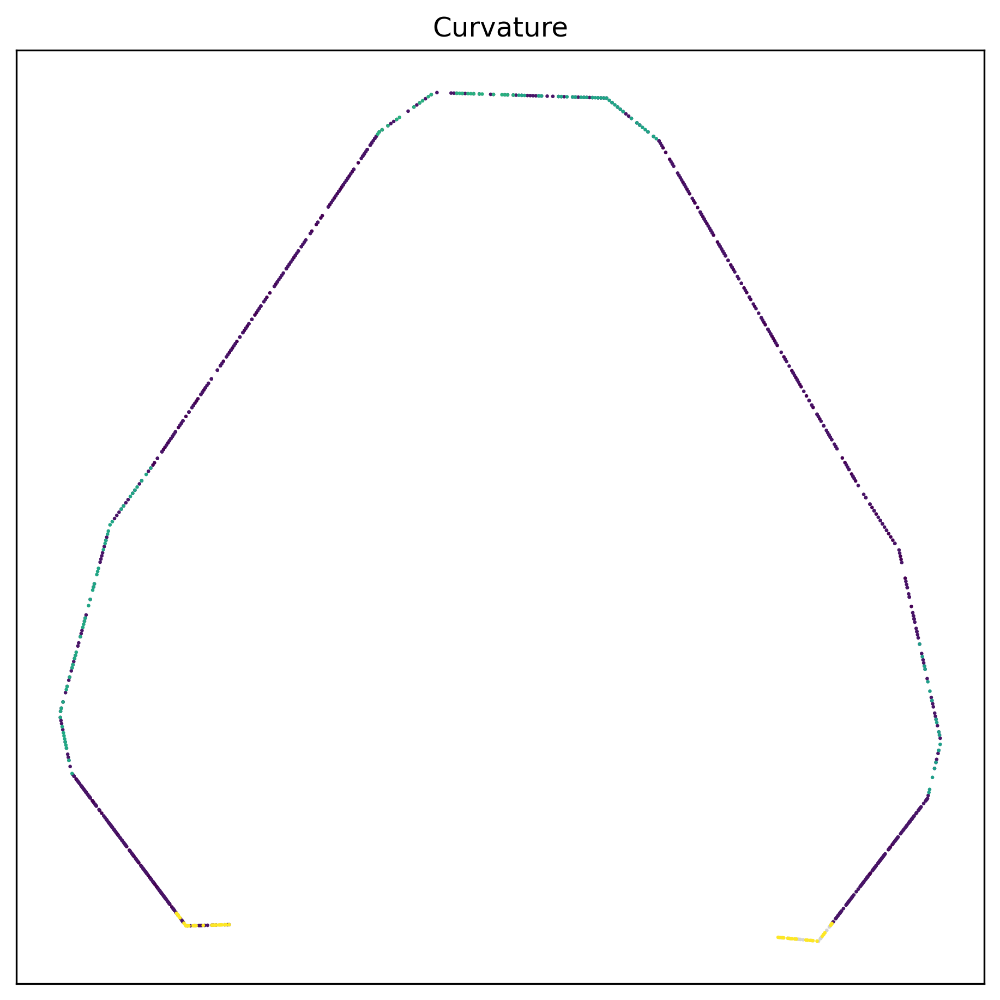

In [145]:
# Plot the curvature values on the UMAP embedding
basis = 'PCA_no_noise'
show_basis = f'{basis}_PCA'
show_cols = [f'curvature_{basis}']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, highlight_indices=None, highlight_size=5, draw_path=False, alpha=1.0,
    font_size=12, point_size=10, path_width=1,
    legend_loc='on data', title='Curvature', colorbar_loc=None, rasterized=True, xlabel=None, ylabel=None,
    figsize=(6, 6), dpi=300, save_path=save_dir / f"curvature_embedding_{file_suffix}.pdf"
)


In [153]:

adata.obs[f'curvature_{basis}']

batch_1_Cell_1      1.432309
batch_1_Cell_3      1.432309
batch_1_Cell_4      1.432309
batch_1_Cell_6      1.432309
batch_1_Cell_7      1.432309
                      ...   
batch_2_Cell_990         NaN
batch_2_Cell_991         NaN
batch_2_Cell_992         NaN
batch_2_Cell_996         NaN
batch_2_Cell_997         NaN
Name: curvature_Concord, Length: 1000, dtype: float64

In [178]:
adata.obs[f'curvature_{basis}'].max()

8.11891861960433

Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - INFO - Building Faiss FlatL2 index.
Concord.model.knn - INFO - Using FAISS CPU index.
Concord.model.knn - WARNING - K-NN graph is not computed. Computing now.
Concord - INFO - Finding path between point_0 and point_30
Concord - INFO - Finding path between point_509 and point_44
Concord - INFO - Finding path between point_19 and point_57
Concord - INFO - Finding path between point_30 and point_67
Concord - INFO - Finding path between point_44 and point_76
Concord - INFO - Finding path between point_57 and point_572
Concord - INFO - Finding path between point_67 and point_580
Concord - INFO - Finding path between point_76 and point_102
Concord - INFO - Finding path between point_572 and point_112
Concord - INFO - Finding path between point_580 and point_122
Concord - INFO - Finding path between point_102 and point_131
Concord - INFO - Finding path between point_112 and point_141
Concord - INFO - Finding path between po

Concord - INFO - Finding path between point_762 and point_304
Concord - INFO - Finding path between point_284 and point_320
Concord - INFO - Finding path between point_787 and point_818
Concord - INFO - Finding path between point_304 and point_827
Concord - INFO - Finding path between point_320 and point_348
Concord - INFO - Finding path between point_818 and point_358
Concord - INFO - Finding path between point_827 and point_855
Concord - INFO - Finding path between point_348 and point_867
Concord - INFO - Finding path between point_358 and point_385
Concord - INFO - Finding path between point_855 and point_888
Concord - INFO - Finding path between point_867 and point_399
Concord - INFO - Finding path between point_385 and point_408
Concord - INFO - Finding path between point_888 and point_415
Concord - INFO - Finding path between point_399 and point_921
Concord - INFO - Finding path between point_408 and point_932
Concord - INFO - Finding path between point_415 and point_437
Concord 

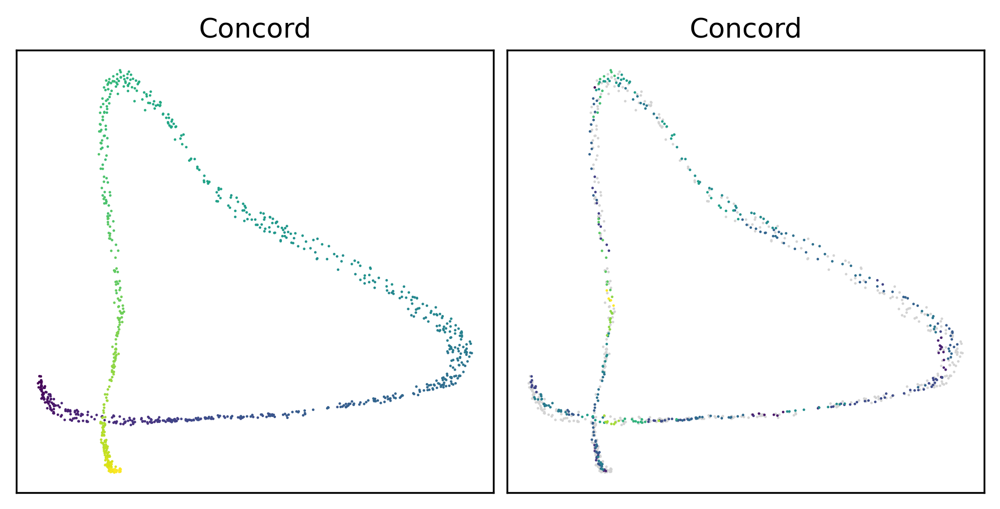

In [196]:
#basis = 'PCA_no_noise'
basis = 'Concord'
k=15
neighborhood = ccd.ul.Neighborhood(adata.obsm[basis], k=k)
show_cols = ['time', f'curvature_{basis}']
adata.obs[f'curvature_{basis}'] = np.nan
#adata.obs[f'curvature_{basis}'] = np.linspace(0, 2, adata.n_obs)
show_basis = basis + '_PCA'

interval_frac = 0.06
interval = int(interval_frac * adata.n_obs)
step_frac = 0.02
step = int(step_frac * adata.n_obs)
time_vec = adata.obs['time']
time_points = np.arange(time_vec.min(), time_vec.max(), step)

for t in time_points:
    # Extract scalar positional indices
    start_time = i * step
    end_time = start_time + interval
    
    start_point = np.argmin(np.abs(time_vec - t))
    end_point = np.argmin(np.abs(time_vec - (t + interval)))

    # Assign curvature values using `.iloc` for position-based slicing
    path, _ = ccd.ul.shortest_path_on_knn_graph(neighborhood, point_a=start_point, point_b=end_point)
    curvature = ccd.ul.curvature_along_path(adata, basis=basis, path=path)
    curvature_new = pd.Series(curvature, index=path)
    curvature_old = pd.Series(adata.obs.iloc[path, adata.obs.columns.get_loc(f'curvature_{basis}')], index=path)
    #print("curvature_new", curvature_new)
    #print("curvature_old", curvature_old)
    curvature_df = pd.concat([curvature_old, curvature_new], axis=1)
    # print("curvature_df", curvature_df)
    # print("curvature_df.mean(axis=1)", curvature_df.mean(axis=1))
    adata.obs.iloc[path, adata.obs.columns.get_loc(f'curvature_{basis}')] = curvature_df.mean(axis=1)
    

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, highlight_indices=None, highlight_size=30, draw_path=False, alpha=1.0, ncols=2,
    font_size=12, point_size=5, path_width=0.2,
    legend_loc='on data', title=basis, colorbar_loc=None, rasterized=True, xlabel=None, ylabel=None,
    figsize=(6, 3), dpi=300, save_path=None
)

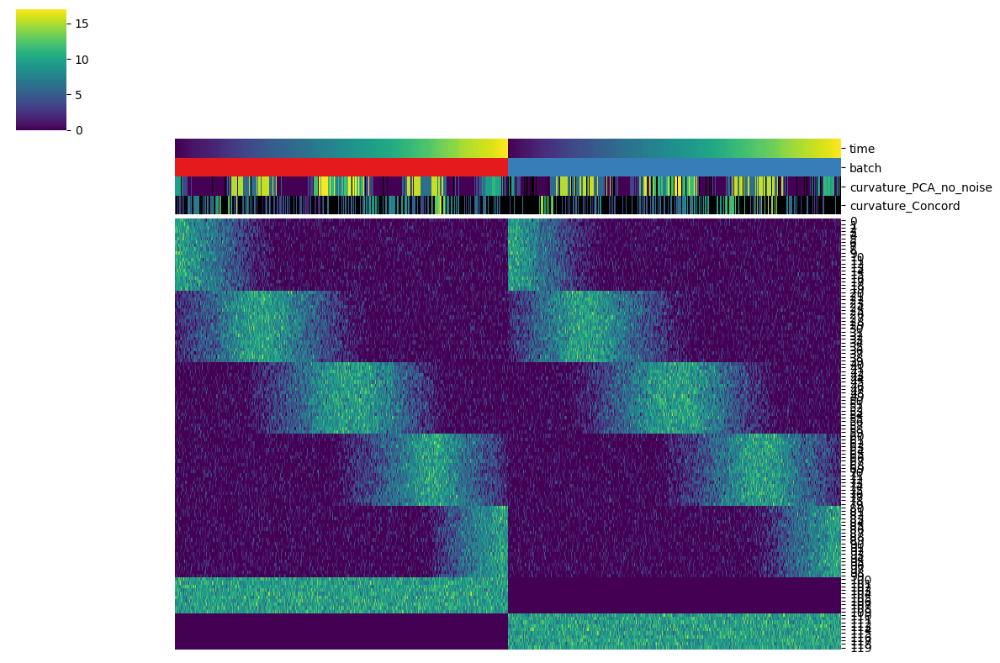

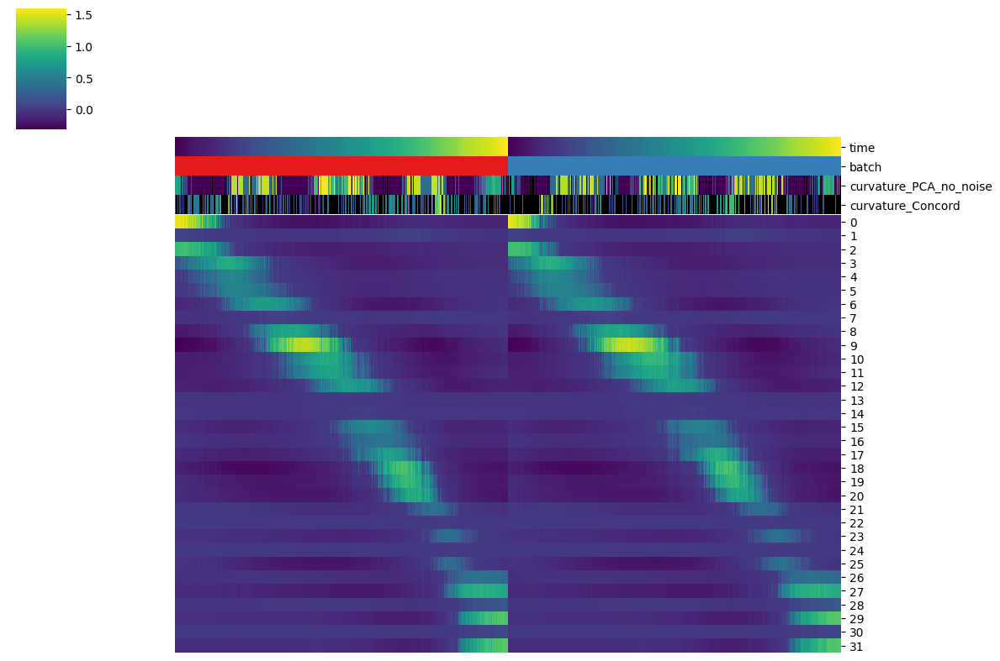

In [201]:
ccd.pl.heatmap_with_annotations(adata, val='X', obs_keys=[state_key, batch_key, f'curvature_PCA_no_noise', f'curvature_{basis}'], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis')

ccd.pl.heatmap_with_annotations(adata, val=basis+'_sorted', obs_keys=[state_key, batch_key, f'curvature_PCA_no_noise', f'curvature_{basis}'], 
                                cluster_cols=False, cluster_rows=False, cmap='viridis')